# Notebook for the Kings County Data Set
Author: Eike Rogall

In [321]:
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import pandas as pd
import seaborn as sns
import plotly
import plotly.express as px


import statsmodels.api as sms
import statsmodels.formula.api as smf


from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score


matplotlib.style.use('seaborn')
%matplotlib inline

 ## Column Names and descriptions for Kings County Data Set
- **id** - Unique ID for each home sold

- **date** - Date of the home sale

- **price** - Price of each home sold

- **bedrooms** - Number of bedrooms

- **bathrooms** - Number of bathrooms, where .5 accounts for a room with a toilet but no shower

- **sqft_living** - Square footage of the apartments interior living space

- **sqft_lot** - Square footage of the land space

- **floors** - Number of floors

- **waterfront** - A dummy variable for whether the apartment was overlooking the waterfront or not

- **view** - An index from 0 to 4 of how good the view of the property was

- **condition** - An index from 1 to 5 on the condition of the apartment,1 - lowest, 5 - highest

- **grade** - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.

- **sqft_above** - The square footage of the interior housing space that is above ground level

- **sqft_basement** - The square footage of the interior housing space that is below ground level

- **yr_built** - The year the house was initially built

- **yr_renovated** - The year of the house’s last renovation

- **zipcode** - What zipcode area the house is in

- **lat** - Lattitude

- **long** - Longitude

- **sqft_living15** - The square footage of interior housing living space for the nearest 15 neighbors

- **sqft_lot15** - The square footage of the land lots of the nearest 15 neighbors

### Added columns
- **sqft_basement_new**: remove the missing of sqft_basement values by sqft_living-sqft_above
- **sqft_total**: Total square footage of the real estate
- **sqft_total15**: Total square footage of the real estate for the nearest 15 neighbors
- **price_per_sqft_living15**: Price of the real estate per square footage living for the nearest 15 neighbors
- **price_per_sqft**: Price of the real estate per total square footage
- **price_per_sqft_living**: Price of the real estate per square footage living
- **price_per_sqft_lot**: Price of the real estate per square footage of the land space
- **month**: Month of home sale
- **year**: year of home sale
- **rating_grade_condition**: A new rating system for the houses (product of grade * condition)
- **price_ratio_15**: Ratio between price_per_sqft_living15 and price_per_sqft_living


The first question I asked myself was: How expensive is a house for a standard four person house hold, are there any bargains and where is the cheapest house with the optimal features.

**HOW ARE TOTAL & TOTAL LIVING USED?** <br>
You use the Total Living square feet when you are considering what it will be like to live in the house. It can also be used to calculate the square feet needed depending on the number of people in the home.

Generally, the **number of people** that will be in the house should be **multiplied by 550 sq. ft.** For example a family of 4 should be looking at homes no smaller than 2200 sq. ft. Of course this is just a rough guide, but it can be a helpful tool.

The Total Square Feet is arguably more important. This number will be used by your builder to help calculate the estimated building cost. In some cases it might also be used to see if a house plan meets the requirements of local building codes or guide-lines.

If you give a builder the Living square feet number to use in his estimate calculations, the costs will be all wrong. So it is very important that these two numbers are clearly understood. <br>
Source: https://saterdesign.com/blogs/news/living-area-explained

The second question was, can I get from the same features I looked for the 4 person house hold, results for Investments.

Data Science Lifecycle
- 1 Business Understanding
- 2 Data Mining
- 3 Data Cleaning
- 4 Data Exploration
- 5 Feature Engineering
- 6 Predictive Modeling
- 7 Data Visualization

In [280]:
house_prices = pd.read_csv('King_County_House_prices_dataset.csv')

## Data cleaning - Type of data and missings

In [281]:
house_prices.head(10)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503
5,7237550310,5/12/2014,1230000.0,4,4.50,5420,101930,1.0,0.0,0.0,...,11,3890,1530.0,2001,0.0,98053,47.6561,-122.005,4760,101930
6,1321400060,6/27/2014,257500.0,3,2.25,1715,6819,2.0,0.0,0.0,...,7,1715,?,1995,0.0,98003,47.3097,-122.327,2238,6819
7,2008000270,1/15/2015,291850.0,3,1.50,1060,9711,1.0,0.0,NaN,...,7,1060,0.0,1963,0.0,98198,47.4095,-122.315,1650,9711
8,2414600126,4/15/2015,229500.0,3,1.00,1780,7470,1.0,0.0,0.0,...,7,1050,730.0,1960,0.0,98146,47.5123,-122.337,1780,8113
9,3793500160,3/12/2015,323000.0,3,2.50,1890,6560,2.0,0.0,0.0,...,7,1890,0.0,2003,0.0,98038,47.3684,-122.031,2390,7570


In [282]:
house_prices.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null object
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(8), int64(11), object(2)
memory usage: 3.5+ MB


To replace the questionmarks in the sqft_basement columns with NaNs and get  the right datatype the following steps were conducted:

In [283]:
house_prices[house_prices['sqft_basement'] == '?'].shape[0]

454

In [284]:
house_prices['sqft_basement'] = house_prices['sqft_basement'].replace('?', np.NaN)
house_prices['sqft_basement'] = house_prices['sqft_basement'].astype(float)

In [285]:
house_prices.eval('sqft_basement_new = sqft_living - sqft_above', inplace=True)
house_prices.drop('sqft_basement', axis=1, inplace=True)

The missing values of all variables were counted:

In [286]:
missing_values = pd.DataFrame(house_prices.isnull().sum(),columns=['count'])
missing_values['percentage'] = missing_values['count']/house_prices.shape[0]*100
missing_values.query('count != 0')

,count,percentage
waterfront,2376,11.001528
view,63,0.291707
yr_renovated,3842,17.789508


**Of the 21 variables 3 have missing values.**

- **waterfront** has 2376 missing values (11 %)
- **view** has 63 missing values (0.29 %)
- **yr_renovated** has 3842 missing values (17,79 %)
- **sqft_basement** had 454 missing values (2,10 %), but was replaced with sqft_basement_new



The column 'view' has only 0,29 % missing values and has 19422 times of 21597 the value 0, so i decided to replace the missing values with 0.

In [287]:
house_prices['view'].value_counts()

0.0    19422
2.0      957
3.0      508
1.0      330
4.0      317
Name: view, dtype: int64

In [288]:
house_prices['view'].fillna(0, inplace=True)

In [289]:
missing_values = pd.DataFrame(house_prices.isnull().sum(),columns=['count'])
missing_values['percentage'] = missing_values['count']/house_prices.shape[0]*100
missing_values.query('count != 0')

,count,percentage
waterfront,2376,11.001528
yr_renovated,3842,17.789508


## Data Exploration 
### Basic Statistic

In [290]:
house_prices.describe().round(2)

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,sqft_basement_new
count,2.159700e+04,21597.00,21597.00,21597.00,21597.00,21597.00,21597.00,19221.00,21597.00,21597.00,21597.00,21597.00,21597.00,17755.00,21597.00,21597.00,21597.00,21597.00,21597.00,21597.00
mean,4.580474e+09,540296.57,3.37,2.12,2080.32,15099.41,1.49,0.01,0.23,3.41,7.66,1788.60,1971.00,83.64,98077.95,47.56,-122.21,1986.62,12758.28,291.73
std,2.876736e+09,367368.14,0.93,0.77,918.11,41412.64,0.54,0.09,0.76,0.65,1.17,827.76,29.38,399.95,53.51,0.14,0.14,685.23,27274.44,442.67
min,1.000102e+06,78000.00,1.00,0.50,370.00,520.00,1.00,0.00,0.00,1.00,3.00,370.00,1900.00,0.00,98001.00,47.16,-122.52,399.00,651.00,0.00
25%,2.123049e+09,322000.00,3.00,1.75,1430.00,5040.00,1.00,0.00,0.00,3.00,7.00,1190.00,1951.00,0.00,98033.00,47.47,-122.33,1490.00,5100.00,0.00
50%,3.904930e+09,450000.00,3.00,2.25,1910.00,7618.00,1.50,0.00,0.00,3.00,7.00,1560.00,1975.00,0.00,98065.00,47.57,-122.23,1840.00,7620.00,0.00
75%,7.308900e+09,645000.00,4.00,2.50,2550.00,10685.00,2.00,0.00,0.00,4.00,8.00,2210.00,1997.00,0.00,98118.00,47.68,-122.12,2360.00,10083.00,560.00
max,9.900000e+09,7700000.00,33.00,8.00,13540.00,1651359.00,3.50,1.00,4.00,5.00,13.00,9410.00,2015.00,2015.00,98199.00,47.78,-121.32,6210.00,871200.00,4820.00


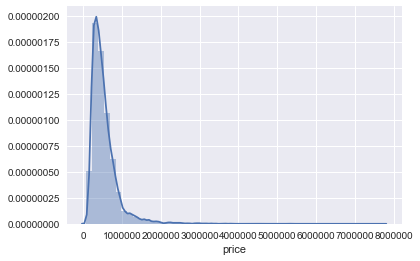

In [291]:
x = house_prices.price
sns.distplot(x);

### Correlation

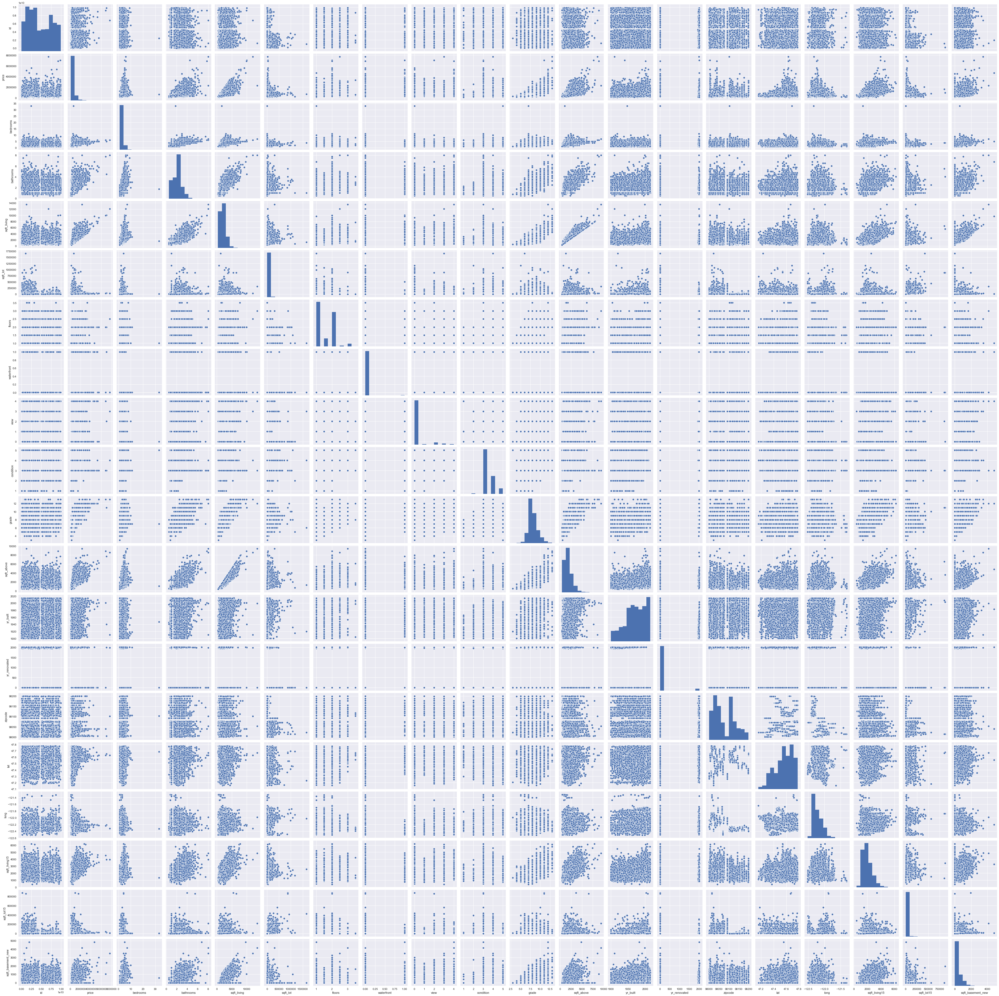

In [292]:
sns.pairplot(house_prices)

**Correlation between the Price and Square footage of the apartments interior living space**

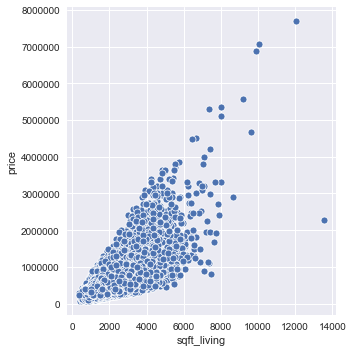

In [293]:
sns.relplot(y="price", x="sqft_living", data=house_prices);

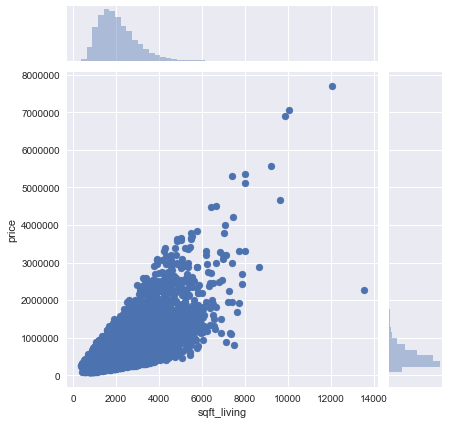

In [294]:
sns.jointplot(y="price", x="sqft_living", data=house_prices);

**Correlation between the Price and Square footage of the land space**

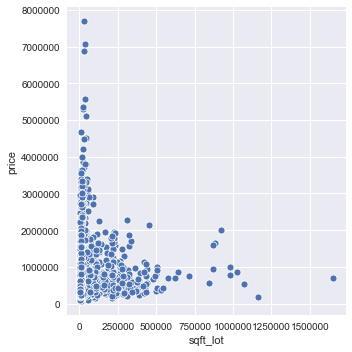

In [295]:
sns.relplot(y="price", x="sqft_lot", data=house_prices);

**Correlation between the Price and grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.**

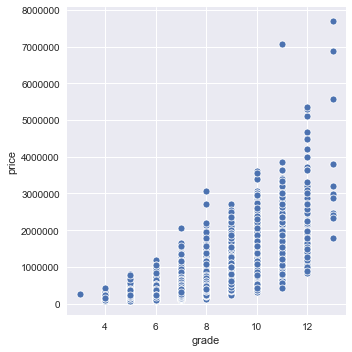

In [296]:
sns.relplot(y="price", x="grade", data=house_prices);

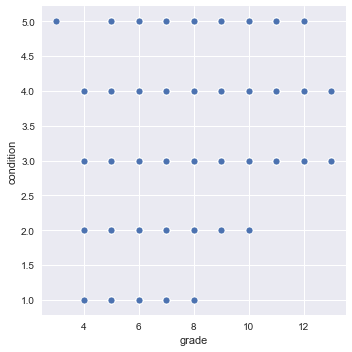

In [297]:
sns.relplot(y="condition", x="grade", data=house_prices);

In [298]:
house_prices.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id                   21597 non-null int64
date                 21597 non-null object
price                21597 non-null float64
bedrooms             21597 non-null int64
bathrooms            21597 non-null float64
sqft_living          21597 non-null int64
sqft_lot             21597 non-null int64
floors               21597 non-null float64
waterfront           19221 non-null float64
view                 21597 non-null float64
condition            21597 non-null int64
grade                21597 non-null int64
sqft_above           21597 non-null int64
yr_built             21597 non-null int64
yr_renovated         17755 non-null float64
zipcode              21597 non-null int64
lat                  21597 non-null float64
long                 21597 non-null float64
sqft_living15        21597 non-null int64
sqft_lot15           21597 non-null int64
sqft_basement_new    21597 non-nul

## Feature Engineering
### Creating Variables

New rating to get one variable out of Grade and Condiition of the houses.

In [299]:
house_prices.eval('rating_grade_condition = grade * condition', inplace=True)

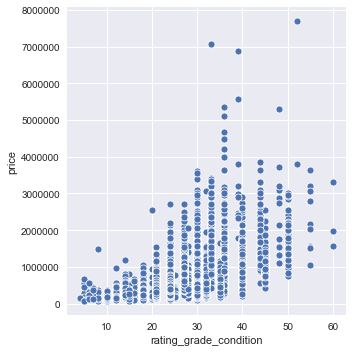

In [300]:
sns.relplot(y="price", x="rating_grade_condition", data=house_prices);

**Total square footage of the sold houses:** sqft_total = sqft_living + sqft_lot

In [301]:
house_prices.eval('sqft_total = sqft_living + sqft_lot', inplace=True)

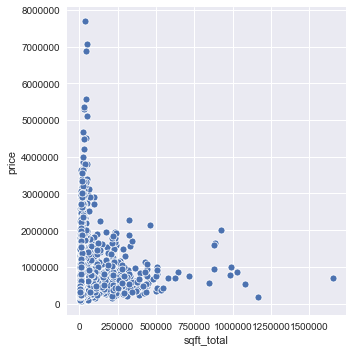

In [302]:
sns.relplot(y="price", x="sqft_total", data=house_prices);

**Total square footage for the nearest 15 neighbors:** sqft_total15 = sqft_living_15 + sqft_lot_15

In [303]:
house_prices.eval('sqft_total15 = sqft_living15 + sqft_lot15', inplace=True)

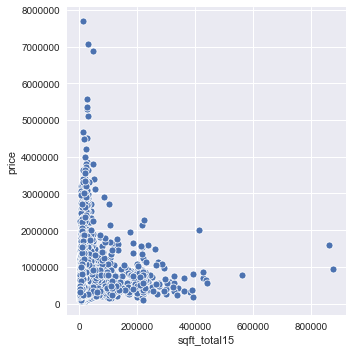

In [304]:
sns.relplot(y="price", x="sqft_total15", data=house_prices);

In [305]:
house_prices.eval('price_per_sqft_living15 = price / sqft_living15', inplace=True)

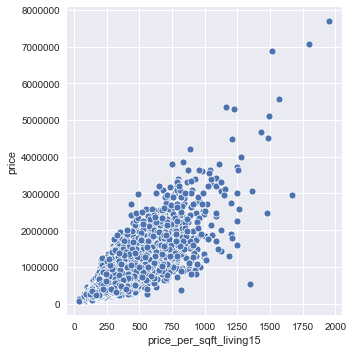

In [306]:
sns.relplot(y="price", x="price_per_sqft_living15", data=house_prices);

**Price per sqft for sold houses**

In [307]:
house_prices.eval('price_per_sqft_living = price / sqft_living', inplace=True)
house_prices.eval('price_per_sqft_lot = price / sqft_lot', inplace=True)

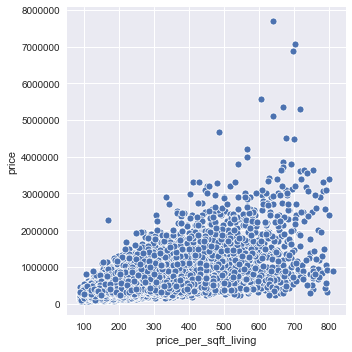

In [308]:
sns.relplot(y="price", x="price_per_sqft_living", data=house_prices);

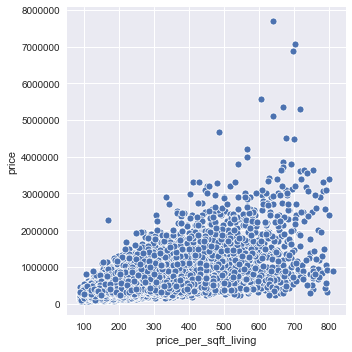

In [309]:
sns.relplot(y="price", x="price_per_sqft_living", data=house_prices);

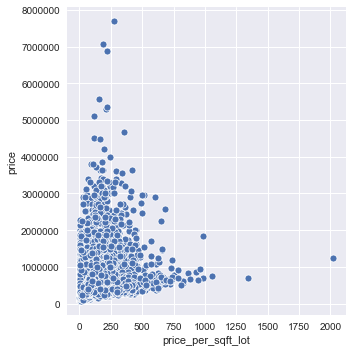

In [310]:
sns.relplot(y="price", x="price_per_sqft_lot", data=house_prices);

**Creating a ratio between price_per_sqft_living15 and price_per_sqft_living**

In [341]:
house_prices.eval('price_ratio_15 = price_per_sqft_living / price_per_sqft_living15', inplace=True)

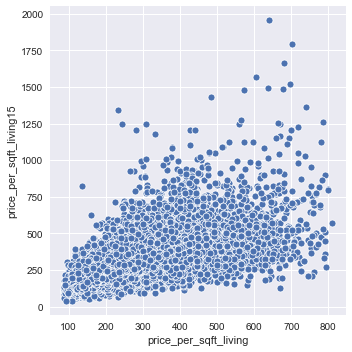

In [342]:
sns.relplot(y="price_per_sqft_living15", x="price_per_sqft_living", data=house_prices);

**Creating new columns "Month" and "Year" for the Date of sale**

In [311]:
house_prices['month'] = [int(x.split('/')[0]) for x in house_prices.date]

In [312]:
house_prices['year'] = [int(x.split('/')[2]) for x in house_prices.date]


In [343]:
house_prices.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_basement_new,rating_grade_condition,sqft_total,sqft_total15,price_per_sqft_living15,price_per_sqft_living,price_per_sqft_lot,month,year,price_ratio_15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,0,21,6830,6990,165.597015,188.050847,39.274336,10,2014,1.135593
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,400,21,9812,9329,318.343195,209.338521,74.288870,12,2014,0.657588
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,0,18,10770,10782,66.176471,233.766234,18.000000,2,2015,3.532468
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,910,35,6960,6360,444.117647,308.163265,120.800000,12,2014,0.693878
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,0,24,9760,9303,283.333333,303.571429,63.118812,2,2015,1.071429


## Predictive Modeling

### Modeling with Statsmodel

In [328]:
lab_lst = [x for x in house_prices.columns]
lab_lst.remove('id')
lab_lst.remove('yr_renovated')
lab_lst.remove('waterfront')
lab_lst.remove('date')
lab_lst.remove('price')
lab_lst

['bedrooms',
 'bathrooms',
 'sqft_living',
 'sqft_lot',
 'floors',
 'view',
 'condition',
 'grade',
 'sqft_above',
 'yr_built',
 'zipcode',
 'lat',
 'long',
 'sqft_living15',
 'sqft_lot15',
 'sqft_basement_new',
 'rating_grade_condition',
 'sqft_total',
 'sqft_total15',
 'price_per_sqft_living15',
 'price_per_sqft_living',
 'price_per_sqft_lot',
 'month',
 'year']

In [329]:
X = house_prices[lab_lst]
X = sms.add_constant(X)
y = house_prices.price


/Users/eikerogall/opt/anaconda3/envs/nf/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



In [330]:
sms.OLS(y, X).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.926
Model:                            OLS   Adj. R-squared:                  0.926
Method:                 Least Squares   F-statistic:                 1.285e+04
Date:                Mon, 08 Jun 2020   Prob (F-statistic):               0.00
Time:                        15:56:07   Log-Likelihood:            -2.7928e+05
No. Observations:               21597   AIC:                         5.586e+05
Df Residuals:                   21575   BIC:                         5.588e+05
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                    1.889e+07   4.97e+06      3.804      0.000    9.16e+06    2.86e+07
bedrooms                -9940.6830    959.542    -10.360      0.000   -1.18e+04   -8059.909
bathrooms                 210.0989   1623.933      0.129      0.897   -2972.930    3393.128
sqft_living                43.0910      1.325     32.520      0.000      40.494      45.688
sqft_lot                  -21.5883      0.663    -32.545      0.000     -22.888     -20.288
floors                  -2.153e+04   2108.670    -10.209      0.000   -2.57e+04   -1.74e+04
view                     1.612e+04   1016.650     15.856      0.000    1.41e+04    1.81e+04
condition               -1.146e+05   7122.400    -16.091      0.000   -1.29e+05   -1.01e+05
grade                   -5.801e+04   3418.044    -16.972      0.000   -6.47e+04   -5.13e+04
sqft_above                 24.5573      1.283     19.136      0.000      22.042      27.073
yr_built                   94.0499     36.444      2.581      0.010      22.617     165.483
zipcode                   -87.3323     16.569     -5.271      0.000    -119.808     -54.856
lat                     -1.238e+05   6024.531    -20.557      0.000   -1.36e+05   -1.12e+05
long                    -8328.3404   6633.527     -1.255      0.209   -2.13e+04    4673.863
sqft_living15             148.7813      1.970     75.507      0.000     144.919     152.644
sqft_lot15                -74.5110      0.986    -75.557      0.000     -76.444     -72.578
sqft_basement_new          18.5479      1.391     13.332      0.000      15.821      21.275
rating_grade_condition   1.563e+04    960.958     16.269      0.000    1.38e+04    1.75e+04
sqft_total                 21.4962      0.662     32.476      0.000      20.199      22.794
sqft_total15               74.2917      0.984     75.467      0.000      72.362      76.221
price_per_sqft_living15  1742.3290     16.493    105.643      0.000    1710.002    1774.656
price_per_sqft_living     517.4301     17.196     30.090      0.000     483.724     551.136
price_per_sqft_lot        -55.4467     11.676     -4.749      0.000     -78.333     -32.561
month                     260.2015    351.173      0.741      0.459    -428.124     948.527
year                    -2895.7162   2348.565     -1.233      0.218   -7499.078    1707.646
==============================================================================
Omnibus:                    23809.417   Durbin-Watson:                   1.984
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         11073572.727
Skew:                           5.020   Prob(JB):                         0.00
Kurtosis:                     113.476   Cond. No.                     2.05e+17
==============================================================================

Warnings:
[1] Standard Errors as

Due to bad p-values, the columns: bathrooms, month, year, long will be removed:

In [317]:
lab_lst.remove('bathrooms')
lab_lst.remove('month')
lab_lst.remove('year')
lab_lst.remove('long')


In [318]:
X = house_prices[lab_lst]
X = sms.add_constant(X)
y = house_prices.price
sms.OLS(y, X).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.926
Model:                            OLS   Adj. R-squared:                  0.926
Method:                 Least Squares   F-statistic:                 1.586e+04
Date:                Mon, 08 Jun 2020   Prob (F-statistic):               0.00
Time:                        15:50:16   Log-Likelihood:            -2.7929e+05
No. Observations:               21597   AIC:                         5.586e+05
Df Residuals:                   21579   BIC:                         5.588e+05
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                    1.329e+07   1.46e+06      9.080      0.000    1.04e+07    1.62e+07
bedrooms                -9942.2534    941.416    -10.561      0.000   -1.18e+04   -8097.009
sqft_living                43.1664      1.289     33.500      0.000      40.641      45.692
sqft_lot                  -21.6318      0.645    -33.530      0.000     -22.896     -20.367
floors                  -2.133e+04   2069.918    -10.303      0.000   -2.54e+04   -1.73e+04
view                     1.618e+04   1016.358     15.918      0.000    1.42e+04    1.82e+04
condition               -1.148e+05   7120.121    -16.121      0.000   -1.29e+05   -1.01e+05
grade                   -5.791e+04   3418.395    -16.940      0.000   -6.46e+04   -5.12e+04
sqft_above                 24.3803      1.277     19.099      0.000      21.878      26.882
yr_built                   82.9350     33.956      2.442      0.015      16.379     149.491
zipcode                   -79.1421     15.058     -5.256      0.000    -108.658     -49.627
lat                     -1.238e+05   5970.168    -20.731      0.000   -1.35e+05   -1.12e+05
sqft_living15             148.5522      1.961     75.736      0.000     144.708     152.397
sqft_lot15                -74.3857      0.982    -75.760      0.000     -76.310     -72.461
sqft_basement_new          18.7818      1.349     13.918      0.000      16.137      21.427
rating_grade_condition   1.568e+04    960.622     16.323      0.000    1.38e+04    1.76e+04
sqft_total                 21.5374      0.644     33.463      0.000      20.276      22.799
sqft_total15               74.1634      0.980     75.681      0.000      72.243      76.084
price_per_sqft_living15  1741.9280     16.438    105.967      0.000    1709.708    1774.148
price_per_sqft_living     516.4565     17.158     30.100      0.000     482.826     550.087
price_per_sqft_lot        -53.6193     11.579     -4.631      0.000     -76.316     -30.923
==============================================================================
Omnibus:                    23835.654   Durbin-Watson:                   1.984
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         11121414.486
Skew:                           5.029   Prob(JB):                         0.00
Kurtosis:                     113.714   Cond. No.                     1.97e+17
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 6.15e-21. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

Due to bad p-value or small t-values, the columns: yr_built, price_per_sqft_lot, price_per_sqft will be removed:

In [319]:
lab_lst.remove('yr_built')
lab_lst.remove('price_per_sqft_lot')
lab_lst.remove('price_per_sqft')
lab_lst.remove('zipcode')

ValueError: list.remove(x): x not in list

In [ ]:
X = house_prices[lab_lst]
X = sms.add_constant(X)
y = house_prices.price
sms.OLS(y, X).fit().summary()

Removing more features to achieve better predicitions:

In [ ]:
lab_lst.remove('lat')
lab_lst.remove('bedrooms')
lab_lst.remove('sqft_basement_new')
lab_lst.remove('sqft_above')


In [ ]:
lab_lst.remove('floors')

In [ ]:
lab_lst.remove('grade')
lab_lst.remove('condition')

In [ ]:
X = house_prices[lab_lst]
X = sms.add_constant(X)
y = house_prices.price
sms.OLS(y, X).fit().summary()

**The best features with the highest impact on predicting the price are:**
- **price_per_sqft_living15**: the price per square footage for the nearest 15 neighbors
- **sqft_living15**: the square footage living for the nearest 15 neighbors


In [ ]:
smf.ols(formula='price ~ price_per_sqft_living15 + sqft_living15', data=house_prices).fit().summary()

But I wanted also include a rating of the quality of the houses so I included the **rating_grade_condition** and the **square footage of the house (sqft_living)**:

In [ ]:
smf.ols(formula='price ~  price_per_sqft_living15+ sqft_living15 + sqft_living+ rating_grade_condition', data=house_prices).fit().summary()

### Modeling with Sklearn


#### Splitting data in Train- and Testsets

In [ ]:
X = house_prices[['price_per_sqft_living15', 'sqft_living15', 'sqft_living', 'rating_grade_condition']]

y = house_prices.price


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42, shuffle=False)
print('X_Train:', X_train.shape[0],'X_Test:', X_test.shape[0])
print('y_Train:', y_train.shape[0],'y_Test:', y_test.shape[0])

#### Modeling

In [ ]:
model_sk = LinearRegression()
model_sk.fit(X_train,y_train)

In [ ]:
model_sk.score(X_train,y_train)

In [ ]:
y_price_pred = model_sk.predict(X_test)
y_price_pred

In [ ]:
# The coefficients
print('Coefficients: \n', model_sk.coef_)
# Root mean squared error
print('Root Mean squared error (RMSE): %.2f'
      % mean_squared_error(y_price_pred, y_test, squared = False))
# r**2: 1 is perfect prediction
print('R**2: %.2f'
      % r2_score(y_test, y_price_pred))

The ideal house for four person should of a square footage of 2200 or more (Source: mentioned above), the price should be under the median value of the neighbourhood and nevertheless should have around the same footage and a decent rating. Owning a house equal to +/- 25% 2,422 square feet, the median size house as of 2016 gives you a typical middle class house size.

In [ ]:
X_train.head()

In [ ]:
X_train.describe().round()

In [357]:
X_optimal = pd.DataFrame({
    'price_per_sqft_living15': [244],
    'sqft_living15': [2200],
    'sqft_living': [2200],
    'rating_grade_condition': [24]
})
X_optimal

,price_per_sqft_living15,sqft_living15,sqft_living,rating_grade_condition
0,244,2200,2200,24


In [ ]:
y_optimal_pred = model_sk.predict(X_optimal)
y_optimal_pred.round(3)

In the US owning a home equal to roughly 4X – 6X your household income puts you in the middle class. (Source: https://www.financialsamurai.com/the-ideal-house-size-and-layout-to-raise-a-family/) In Seattle the median income in 2015 was 80000 US-D per year and household. That make middle class houses range from 320000 to 640000 US-D. The prediction of the optimal price for a four person household of **549174.70 US-D** lays in this range.

In [ ]:
price_opt_four = house_prices.query('sqft_living > 2200 and bathrooms >= 2 and price < 549174.70 and  rating_grade_condition > 24 and bedrooms >=4')
print('Min price grouped by condition:', price_opt_four.groupby('condition')['price'].min())
print('Max price grouped by condition:',price_opt_four.groupby('condition')['price'].max())

In [369]:
price_opt_four[price_opt_four['price'] == 265000]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_basement_new,rating_grade_condition,sqft_total,sqft_total15,price_per_sqft_living15,price_per_sqft,price_per_sqft_living,price_per_sqft_lot,month,year
5820,7749500250,8/27/2014,265000.0,5,2.25,2600,8075,1.5,0.0,0.0,...,0,32,10675,11000,120.454545,101.923077,101.923077,32.817337,8,2014
15760,8698600080,9/10/2014,265000.0,5,2.75,2920,5250,1.5,0.0,0.0,...,1120,35,8170,6470,217.213115,90.753425,90.753425,50.476190,9,2014


For the Investment I will look at the same features as before but instead of the rating_grade_condition I will add a ration between the the **price_per_sqft_living15** and **price_per_sqft_living** to check for houses, that cost less per square feet than the surrounding houses (**price_ratio_15**: the lower the better).


In [345]:
X_2 = house_prices[['price_per_sqft_living15', 'sqft_living15', 'sqft_living', 'price_ratio_15']]

y_2 = house_prices.price


In [348]:
X_2_train, X_2_test, y_2_train, y_2_test = train_test_split(X_2, y_2, test_size=0.33, random_state=42, shuffle=False)
print('X_Train:', X_2_train.shape[0],'X_Test:', X_2_test.shape[0])
print('y_Train:', y_2_train.shape[0],'y_Test:', y_2_test.shape[0])

X_Train: 14469 X_Test: 7128
y_Train: 14469 y_Test: 7128


In [350]:
model_sk_2 = LinearRegression()
model_sk_2.fit(X_2_train,y_2_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [351]:
model_sk_2.score(X_2_train,y_2_train)

0.9186506414247168

In [352]:
y_price_pred_2 = model_sk.predict(X_2_test)
y_price_pred_2

array([799071.89473491, 257259.2685319 , 394472.33221696, ...,
       514460.46071726, 399450.36831284, 352659.94600977])

In [353]:
# The coefficients
print('Coefficients: \n', model_sk_2.coef_)
# Root mean squared error
print('Root Mean squared error (RMSE): %.2f'
      % mean_squared_error(y_price_pred_2, y_2_test, squared = False))
# r**2: 1 is perfect prediction
print('R**2: %.2f'
      % r2_score(y_2_test, y_price_pred_2))

Coefficients: 
 [2.10893354e+03 2.04748339e+02 9.59522219e+01 1.65213563e+05]
Root Mean squared error (RMSE): 102581.68
R**2: 0.92


In [354]:
X_2.describe().round(2)

,price_per_sqft_living15,sqft_living15,sqft_living,price_ratio_15
count,21597.00,21597.00,21597.00,21597.00
mean,270.52,1986.62,2080.32,1.03
std,129.18,685.23,918.11,0.31
min,39.51,399.00,370.00,0.17
25%,183.04,1490.00,1430.00,0.86
50%,246.19,1840.00,1910.00,1.00
75%,320.69,2360.00,2550.00,1.13
max,1954.31,6210.00,13540.00,5.34


In [356]:
X_2_optimal = pd.DataFrame({
    'price_per_sqft_living15': [246],
    'sqft_living15': [1840],
    'sqft_living': [1910],
    'price_ratio_15': [1.0]
})
X_2_optimal

,price_per_sqft_living15,sqft_living15,sqft_living,price_ratio_15
0,246,1840,1910,1.0


In [359]:
y_optimal_pred_2 = model_sk_2.predict(X_2_optimal)
y_optimal_pred_2.round(3)

array([440339.467])

The predicted optimal price for a real estate with median features and a price_ratio_15 of 1 (**price_per_sqft_living15** and **price_per_sqft_living** are equal) is 440339.47 US-D. Now we will look for cheaper real estate, with a lower price_ratio_15, a low condition value.

In [372]:
price_opt = house_prices.query('sqft_living >= 2200 and price < 440339.467 and price_ratio_15 < 1')
print(price_opt.shape[0])
print('Min price grouped by condition:', price_opt.groupby('condition')['price'].min(), )
print('Max price grouped by condition:',price_opt.groupby('condition')['price'].min())

1164
Min price grouped by condition: condition
1    227000.0
2    235500.0
3    200000.0
4    199950.0
5    250000.0
Name: price, dtype: float64
Max price grouped by condition: condition
1    227000.0
2    235500.0
3    200000.0
4    199950.0
5    250000.0
Name: price, dtype: float64


In [373]:
price_opt.query('price == 227000 or price == 235500 or price == 199950')

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_basement_new,rating_grade_condition,sqft_total,sqft_total15,price_per_sqft_living15,price_per_sqft_living,price_per_sqft_lot,month,year,price_ratio_15
3962,5152600090,7/8/2014,235500.0,5,2.50,2340,13713,1.0,0.0,0.0,...,670,16,16053,13080,113.221154,100.641026,17.173485,7,2014,0.888889
6517,8661000089,7/16/2014,199950.0,3,2.75,2270,13590,1.5,0.0,0.0,...,970,24,15860,14705,172.370690,88.083700,14.713024,7,2014,0.511013
12655,4006000281,7/29/2014,227000.0,3,1.75,2380,12681,1.0,0.0,0.0,...,1000,6,15061,8097,131.976744,95.378151,17.900796,7,2014,0.722689


## Data Visualization

**Map scatter plot for houses above 2200 squarefeet, 2 or more bathrooms, a Price below 549174.70 US-D, more than 4 bedrooms and a rating above 24:** The bigger the circles the more expensive the house and a color scale for the product of condition and grade - An index from 25 (red) to 45 (green) on the product of condition and grade of the apartment,5 - lowest, 60 - highest

In [322]:
fig = px.scatter_mapbox(house_prices.query(
    'sqft_living > 2200 and bathrooms >= 2 and price < 549174.70 and rating_grade_condition > 24 and bedrooms >= 4'
),
                        lat="lat",
                        lon="long",
                        hover_name="id",
                        hover_data=["price", "sqft_living"],
                        size='price',
                        color='rating_grade_condition',
                        color_continuous_scale=['yellow', 'green'],
                        color_discrete_sequence=["fuchsia"],
                        zoom=7,
                        height=300)
    




fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.show()

**Same map scatter plot as above for the two cheapest real estates with the right features**

In [323]:
fig = px.scatter_mapbox(house_prices.query(
    'sqft_living > 2200 and bathrooms >= 2 and price == 265000 and rating_grade_condition > 24 and bedrooms >= 4'
),
                        lat="lat",
                        lon="long",
                        hover_name="id",
                        hover_data=["price", "sqft_living"],
                        size='price',
                        color='rating_grade_condition',
                        color_continuous_scale=['yellow', 'green'],
                        color_discrete_sequence=["fuchsia"],
                        zoom=7,
                        height=300)
    




fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.show()

**Map scatter plot for houses above 2200 squarefeet, a price below 440339.47 US-D and a price_ratio_15 below 1:** the bigger the circles the more expensive the house and a color scale for the condition - An index from 1 (red) to 5 (green) on the condition of the apartment,1 - lowest, 5 - highest

In [381]:
fig = px.scatter_mapbox(house_prices.query(
    'sqft_living >= 2200 and price < 440339.467 and price_ratio_15 < 1'),
                        lat="lat",
                        lon="long",
                        hover_name="id",
                        hover_data=["price", "condition"],
                        size='price',
                        color='condition',
                        color_continuous_scale=['red', 'yellow', 'green'],
                        color_discrete_sequence=["fuchsia"],
                        zoom=7,
                        height=300)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.show()

**Same map scatter plot as above for the three cheapest real estates with the right features**

In [380]:
fig = px.scatter_mapbox(price_opt.query('price == 227000 or price == 235500 or price == 199950'),
                        lat="lat",
                        lon="long",
                        hover_name="id",
                        hover_data=["price", "condition", "price_ratio_15", "sqft_living", "sqft_living15"],
                        size='price',
                        color='condition',
                        color_continuous_scale=['red', 'yellow', 'green'],
                        color_discrete_sequence=["fuchsia"],
                        zoom=7,
                        height=300)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})

fig.show()

**Price per squarfeet and Price over Time**

In [331]:
price_per_sqft_month = house_prices.groupby(['year', 'month'])['price_per_sqft_living'].median()


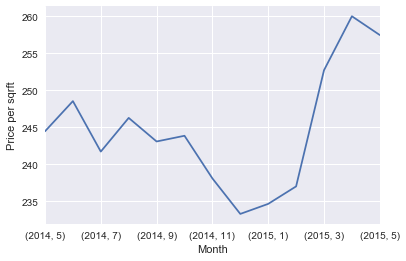

In [332]:
price_per_sqft_month.plot(kind='line')
plt.ylabel("Price per sqrft")
plt.xlabel("Month");

In [333]:
price_month = house_prices.groupby(['year', 'month'])['price'].median()

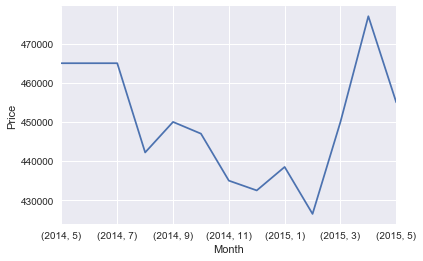

In [334]:
price_month.plot(kind='line')
plt.ylabel("Price")
plt.xlabel("Month");

**Density Mapbox for House Price per Squarefoot over the Timeline from May/2014 until May 2015.**

In [383]:
prices_sorted = house_prices.sort_values(['year', 'month'])

In [387]:
fig = px.density_mapbox(house_prices,
                        lat='lat',
                        lon='long',
                        z='price_per_sqft_living15',
                        radius=10,
                        center=dict(lat=47.53, lon=-122.23),
                        zoom=7,
                        mapbox_style="open-street-map"
                        )
fig.write_html("figures/map_price.html")
fig.show()

In [388]:
fig = px.density_mapbox(house_prices,
                        lat='lat',
                        lon='long',
                        z='price_ratio_15',
                        radius=10,
                        center=dict(lat=47.53, lon=-122.23),
                        zoom=7,
                        mapbox_style="open-street-map")
fig.write_html("figures/map_price.html")
fig.show()